In [1]:
# Supress unnecessary warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import the necessary packages

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA
import xgboost as xgb
from sklearn import metrics
from sklearn import model_selection


from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = 300

import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import plot_roc_curve
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegressionCV

In [3]:
#loading the dataset
data = pd.read_csv('telecom_churn_data.csv')
data.head(15)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,

In [4]:
# Inspecting the shape of the dataset

data.shape

(99999, 226)

In [5]:
data.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [6]:
data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [7]:
data.info

<bound method DataFrame.info of        mobile_number  circle_id  loc_og_t2o_mou  std_og_t2o_mou  \
0         7000842753        109             0.0             0.0   
1         7001865778        109             0.0             0.0   
2         7001625959        109             0.0             0.0   
3         7001204172        109             0.0             0.0   
4         7000142493        109             0.0             0.0   
...              ...        ...             ...             ...   
99994     7001548952        109             0.0             0.0   
99995     7000607688        109             0.0             0.0   
99996     7000087541        109             0.0             0.0   
99997     7000498689        109             0.0             0.0   
99998     7001905007        109             0.0             0.0   

       loc_ic_t2o_mou last_date_of_month_6 last_date_of_month_7  \
0                 0.0            6/30/2014            7/31/2014   
1                 0.0        

## Data Cleaning and Preparation

As part of Data cleaning process the following points will be verified
- Missing value analysis
- Handling Outliers
- Fixing invalid values
- Handing data types

In [8]:
# Checking the percentage of missing values in each column
round(100*(data.isnull().sum()/len(data.index)), 2)

mobile_number                0.00
circle_id                    0.00
loc_og_t2o_mou               1.02
std_og_t2o_mou               1.02
loc_ic_t2o_mou               1.02
last_date_of_month_6         0.00
last_date_of_month_7         0.60
last_date_of_month_8         1.10
last_date_of_month_9         1.66
arpu_6                       0.00
arpu_7                       0.00
arpu_8                       0.00
arpu_9                       0.00
onnet_mou_6                  3.94
onnet_mou_7                  3.86
onnet_mou_8                  5.38
onnet_mou_9                  7.75
offnet_mou_6                 3.94
offnet_mou_7                 3.86
offnet_mou_8                 5.38
offnet_mou_9                 7.75
roam_ic_mou_6                3.94
roam_ic_mou_7                3.86
roam_ic_mou_8                5.38
roam_ic_mou_9                7.75
roam_og_mou_6                3.94
roam_og_mou_7                3.86
roam_og_mou_8                5.38
roam_og_mou_9                7.75
loc_og_t2t_mou

It is observed that the Recharge related, arpu_3g and night_pck_user columns have around 74% of the missing data.

- From the data we can say that if the recharge date, recharge amount and other recharge related informaion is missing together, we can say that the customer has not done any recharge.
- We can impute these meaningful missing values with Zero.

In [9]:
#Imputing NA values with zeroes
data.fillna(value=0, inplace=True)

### Missing Value Imputation

- We looked into all the columns with NaN values
- All the incoming mou, outgoing calls mou, recharge amount data and calls, counts and total amounts are all numerical columns.
- For all above columns, a NaN value means that customer didn't make any calls or used any data or didn't recahrge once, so we are imputing all these NaN values with zero
- For fb_user column & night_pack columns, 1 means true(enrolled) and 0 means (not enrolled). We are considering NaN value as 0(not enrolled) and replaced all NaN values with 0 for these two columns

In [10]:
data.head(15)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.00,5.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.

## Filtering high Value Customers

- Calculate Average recharge value
- Calculate the 70th percentile of avg recharge
- Filter customers with avg rech value greater than 70th percentile calculated above

In [11]:
data["total_rech_data_val_6"] = data["av_rech_amt_data_6"] * data["total_rech_data_6"]
data["total_rech_data_val_7"] = data["av_rech_amt_data_7"] * data["total_rech_data_7"]
data["total_rech_data_val_8"] = data["av_rech_amt_data_8"] * data["total_rech_data_8"]
data["total_rech_data_val_9"] = data["av_rech_amt_data_9"] * data["total_rech_data_9"]

In [12]:
#data["avg_rech_amt_good_phase"] = (data["total_rech_amt_6"] + data["total_rech_amt_7"] + data["total_rech_data_val_6"] + data["total_rech_data_val_7"]) / ( data["total_rech_num_6"] + data["total_rech_num_7"] + data["total_rech_data_6"] + data["total_rech_data_7"] )

In [13]:
data["avg_rech_amt_good_phase"] = (data["total_rech_amt_6"] + data["total_rech_amt_7"] + data["total_rech_data_val_6"] + data["total_rech_data_val_7"]) / 2

In [14]:
# Calculating the 70th percentile value
filter_value = data.avg_rech_amt_good_phase.quantile(0.7)
print(filter_value)

478.0


In [15]:
data["avg_rech_amt_good_phase"].describe()

count    99999.000000
mean       485.328068
std        869.423594
min          0.000000
25%        128.000000
50%        275.000000
75%        553.000000
max      61236.000000
Name: avg_rech_amt_good_phase, dtype: float64

In [16]:
# Looking at the shape of dataset after filtering High value customers
data[data.avg_rech_amt_good_phase>filter_value].shape

(29953, 231)

In [17]:
# Filtering High Value Customers
data_HVC = data[data.avg_rech_amt_good_phase>filter_value]
data_HVC = data_HVC.reset_index(drop=True)
data_HVC

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_rech_data_val_6,total_rech_data_val_7,total_rech_data_val_8,total_rech_data_val_9,avg_rech_amt_good_phase
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,4.13,0.00,0.00,0.00,1.15,0.00,0.00,0.

After filetring High value customers we have **29.9K** rows

### Deriving the Target Variable

- In this case study we are considering **Usage Based Churn** 
- The Customers who have NOT made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase are tagged as **Churn**

In [18]:
# Calculating the total of incoming and outgoing calls of Churn phase
data_HVC['total_mou_churnPhase'] = data_HVC['total_ic_mou_9'] + data_HVC['total_og_mou_9']

In [19]:
# Calculating the total of volume of data used on Churn phase
data_HVC['total_vol_churnPhase'] = data_HVC['vol_2g_mb_9'] + data_HVC['vol_3g_mb_9']

In [20]:
# Tagging the churned customers

data_HVC['churn'] = data_HVC.apply(lambda row: 1 if (row.total_mou_churnPhase == 0 and row.total_vol_churnPhase == 0) else 0, axis=1)

In [21]:
data_HVC[['total_mou_churnPhase','total_vol_churnPhase','churn']]

,total_mou_churnPhase,total_vol_churnPhase,churn
0,0.00,0.00,1
1,0.00,0.00,1
2,177.09,0.00,0
3,1284.14,0.00,0
4,255.11,328.67,0
...,...,...,...
29948,455.84,0.00,0
29949,163.70,955.97,0
29950,1642.35,950.62,0
29951,448.00,393.39,0


In [22]:
# Segregating churn phase column names
Churn_cols = data_HVC.columns[data_HVC.columns.str.contains('_9')]

In [23]:
# drop all columns corresponding to the churn phase
data_HVC.drop(Churn_cols,axis=1,inplace=True)

In [24]:
data_HVC.shape

(29953, 179)

In [25]:
# Verify that all the Churn phase column (_9) are removed 
data_HVC.columns[data_HVC.columns.str.contains('_9')]

Index([], dtype='object')

In [26]:
# Dropping the derived columns
data_HVC.drop(['total_mou_churnPhase','total_vol_churnPhase'], axis =1, inplace = True)

In [27]:
data_HVC.churn = data_HVC.churn.astype('category')

In [28]:
#Checking class imbalance
print(data_HVC.churn.value_counts())
print("Churn percentage is ", (data_HVC.churn.value_counts()[1]/ len(data_HVC.churn))*100)

0    27520
1     2433
Name: churn, dtype: int64
Churn percentage is  8.122725603445398


### Data Preparation and Pre Processing

- Deriving New Variables
- Univariate and Bivariate Analysis
- Train test split
- Scaling
- Handling Data imbalance
- PCA (Principle Component Analysis)

In [29]:
data_HVC["total_loc_ic"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(pat="^loc.ic.", regex=True)]].sum(axis=1)
data_HVC["total_std_ic"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(pat="^std.ic.", regex=True)]].sum(axis=1)
data_HVC["total_roam_ic"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(pat="^roam.ic.", regex=True)]].sum(axis=1)
data_HVC["total_isd_ic"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(pat="^isd.ic.", regex=True)]].sum(axis=1)

In [30]:
data_HVC["total_ic"] = data_HVC["total_loc_ic"] + data_HVC["total_std_ic"] + data_HVC["total_roam_ic"] + data_HVC["total_isd_ic"] + data_HVC["spl_ic_mou_6"] + data_HVC["spl_ic_mou_7"] + data_HVC["spl_ic_mou_8"] + data_HVC["ic_others_6"] + data_HVC["ic_others_7"] + data_HVC["ic_others_8"]

In [31]:
data_HVC["total_loc_og"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(pat="^loc.og.", regex=True)]].sum(axis=1)
data_HVC["total_std_og"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(pat="^std.og.", regex=True)]].sum(axis=1)
data_HVC["total_roam_og"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(pat="^roam.og.", regex=True)]].sum(axis=1)
data_HVC["total_isd_og"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(pat="^isd.og.", regex=True)]].sum(axis=1)

In [32]:
data_HVC["total_og"] = data_HVC["total_loc_og"] + data_HVC["total_std_og"] + data_HVC["total_roam_og"] + data_HVC["total_isd_og"] + data_HVC["spl_og_mou_6"] + data_HVC["spl_og_mou_7"] + data_HVC["spl_og_mou_8"] + data_HVC["og_others_6"] + data_HVC["og_others_7"] + data_HVC["og_others_8"]

We have dervied New features which gives total calls data instead of t2t, t2c etc. Some of the derived features are 'total_ic' ,'total_og' etc.

## Univariate and Bivariate Analysis

In [33]:
px.histogram(data_frame=data_HVC, x="total_ic",nbins=10)

In [34]:
px.scatter(data_frame=data_HVC, x="total_ic", y="total_og", color="churn")

- Could see that customers who churned have less outgoing and incoming calls
- Most of the churners are grouped at same place(bottom left)

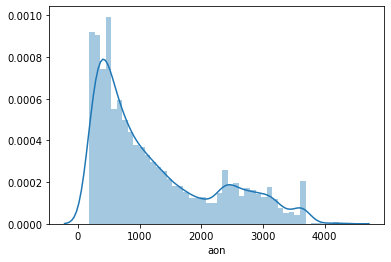

In [35]:
sns.distplot(data_HVC[data_HVC.churn == 0]["aon"])
plt.show()

In [36]:
px.histogram(data_HVC[data_HVC.churn == 0]["aon"])

In [37]:
px.histogram(data_frame=data_HVC, x="aon", color="churn")

- From the above plots, could see that more churners have less **aon** value.
- Customers who are using the network for a long term are less likely to churn

In [38]:
data_HVC["call_centre_mou"] = data_HVC[data_HVC.columns[data_HVC.columns.str.contains(".t2c.")]].sum(axis = 1)

As t2c are calls to operators own Customer Care we have aggregated all the t2c columns and derived a new feature which gives total mou to Call centre.

In [39]:
px.histogram(data_frame=data_HVC, y="call_centre_mou", x="aon",color="churn")

- Looks like, we can infer that customers with less age on network and less calls to CustomerCare are more likely to churn
- It might be the case that, Customers are feel convinced and satisfied after call with CustomerCare and are continuing in the same network

#### Steps to follow
- Deleting unnecessary columns
- Changing dtypes to catergorical wherever necessary
- Dummy variable creation, if applicable( not required in this case)
- Handling Class imbalance
- Data Prepocessing(scaling, transformation)
- PCA
- Model builing
- Hyper parameter tuning(GridSearch CV)
- Evaluation metrics
- Second Model for Interpretation(Logistic Regression or Decision Tree)

In [40]:
# dropping circle_id column
data_HVC.drop(['circle_id','mobile_number','avg_rech_amt_good_phase','date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','max_rech_amt_8','max_rech_amt_7','max_rech_amt_6','last_day_rch_amt_6','last_day_rch_amt_7','last_day_rch_amt_8','max_rech_data_6','max_rech_data_7','max_rech_data_8'], axis ='columns', inplace = True)

In [41]:
data_HVC.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis=1, inplace=True)

In [42]:
# Aggregating data related columns
data_HVC['monthly_tot_DATA_6'] = data_HVC['monthly_2g_6'] + data_HVC['monthly_3g_6']
data_HVC['monthly_tot_DATA_7'] = data_HVC['monthly_2g_7'] + data_HVC['monthly_3g_7']
data_HVC['monthly_tot_DATA_8'] = data_HVC['monthly_2g_8'] + data_HVC['monthly_3g_8']

data_HVC['monthly_tot_DATA_sachet_6'] = data_HVC['sachet_2g_6'] + data_HVC['sachet_3g_6']
data_HVC['monthly_tot_DATA_sachet_7'] = data_HVC['sachet_2g_7'] + data_HVC['sachet_3g_7']
data_HVC['monthly_tot_DATA_sachet_8'] = data_HVC['sachet_2g_8'] + data_HVC['sachet_3g_8']


In [43]:
# dropping the original columns as we have the derived columns
data_HVC.drop(['monthly_2g_6','monthly_3g_6','monthly_2g_7','monthly_3g_7','monthly_2g_8','monthly_3g_8','sachet_2g_6','sachet_3g_6','sachet_2g_7','sachet_3g_7','sachet_2g_8','sachet_3g_8'], axis =1, inplace = True)

In [44]:
# Changing the data type of categorical columns
data_HVC.night_pck_user_6.astype('category')
data_HVC.night_pck_user_7.astype('category')
data_HVC.night_pck_user_8.astype('category')
data_HVC.fb_user_6.astype('category')
data_HVC.fb_user_7.astype('category')
data_HVC.fb_user_8.astype('category')

0        1.0
1        0.0
2        1.0
3        0.0
4        1.0
        ... 
29948    1.0
29949    1.0
29950    1.0
29951    1.0
29952    1.0
Name: fb_user_8, Length: 29953, dtype: category
Categories (2, float64): [0.0, 1.0]

## Train Test Split

In [45]:
#Dividing target varibale and other dependent variables
X = data_HVC.drop(['churn'],1)
y = data_HVC[['churn']]

In [46]:
#Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [47]:
y_test.shape

(8986, 1)

In [48]:
np.reshape(y_train, (-1,1))
np.reshape(y_test, (-1,1))

,churn
14483,0
8922,0
15014,0
19846,0
27504,0
...,...
28159,0
12853,0
3762,0
29065,0


### Scaling (Standard Scaler) and Handling Class Imbalance (SMOTE)

In [49]:
col_names = X.columns

In [50]:
# Scaling using Standard scaler to scale the data
StdScaler = StandardScaler()
X_train_scaled = StdScaler.fit_transform(X_train)
X_test_scaled = StdScaler.transform(X_test)

In [51]:
#Using SMOTE technique to handle class imbalanace
smote = SMOTE(random_state=0)
X_train_balanced, y_train_balanced = smote.fit_sample(X_train_scaled, y_train)

In [52]:
#Checking class imbalance after using SMOTE
y_train_balanced['churn'].value_counts()

1    19215
0    19215
Name: churn, dtype: int64

In [53]:
X_train_balanced = pd.DataFrame(X_train_balanced, columns=col_names)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=col_names)

### PCA (Principle component Analysis)

In [54]:
#PCA for dimensionality reduction
pca = PCA(random_state=42)

In [55]:
pca.fit(X_train_balanced)

PCA(random_state=42)

In [56]:
pca.explained_variance_ratio_

array([1.22537984e-01, 9.16274184e-02, 7.40615011e-02, 6.44231854e-02,
       4.65806527e-02, 3.95980447e-02, 3.43360793e-02, 2.87694143e-02,
       2.64482202e-02, 2.47276324e-02, 2.19425108e-02, 1.86767147e-02,
       1.74947273e-02, 1.65653287e-02, 1.63145303e-02, 1.53545315e-02,
       1.44693520e-02, 1.35101145e-02, 1.23348363e-02, 1.19764569e-02,
       1.14527807e-02, 1.10359586e-02, 1.03765093e-02, 9.66914562e-03,
       9.52628210e-03, 9.11054206e-03, 8.60394568e-03, 8.33804294e-03,
       7.91164756e-03, 7.70951276e-03, 7.55465247e-03, 6.60559420e-03,
       6.49348078e-03, 6.10315864e-03, 6.04947151e-03, 5.82007714e-03,
       5.61585123e-03, 5.41585048e-03, 5.31869950e-03, 5.21091520e-03,
       5.19569927e-03, 5.08255989e-03, 4.96327013e-03, 4.76907656e-03,
       4.40799268e-03, 4.30713452e-03, 4.22899605e-03, 3.97330234e-03,
       3.82646307e-03, 3.74529165e-03, 3.64581856e-03, 3.59630171e-03,
       3.36578015e-03, 3.24820812e-03, 3.12422516e-03, 2.86217726e-03,
      

In [57]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

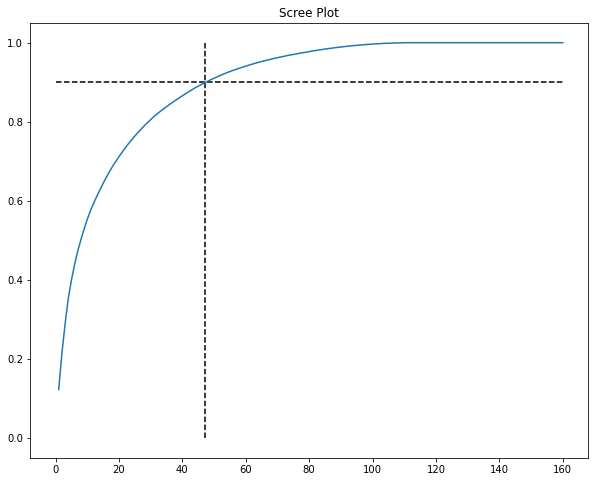

In [58]:
#plotting Scree plot
plt.figure(figsize=(10,8))
plt.title("Scree Plot")
plt.plot(range(1,len(var_cumu)+1), var_cumu)
plt.hlines(y=0.90, xmin=0, xmax=160, linestyles="--")
plt.vlines(x=47, ymin=0, ymax=1, linestyles="--")
plt.show()

 - Looking at the Scree plot we can see that 90% of varience is explained by 47 components
 - Implementing final PCA with n_components as 47

In [59]:
# Final PCA model with 47 n_components
pca_final = PCA(random_state=42, n_components = 47)
X_train_reduced = pca_final.fit_transform(X_train_balanced)
X_test_reduced = pca_final.transform(X_test_scaled)

In [60]:
# converting nd arrays to Dataframes
X_train_reduced = pd.DataFrame(X_train_reduced)
X_train_reduced.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46
0,3.696985,-1.517180,9.924691,-0.826243,1.451628,0.731134,0.595417,-2.492799,-0.901291,0.128082,-0.517514,1.447483,-0.268551,1.162069,1.759842,-0.158408,0.096100,0.956852,0.255309,1.077972,0.487779,0.438809,-0.394815,0.264255,-1.343696,-1.954051,-0.605873,-0.288338,0.414494,-0.209452,-1.001383,0.385624,-1.229591,-1.204919,1.190640,-0.082397,-0.674751,4.260656,-0.665675,-3.547751,-0.752396,3.060054,-0.201742,-0.773387,-0.013970,0.625529,0.521805
1,1.474608,-1.358061,-0.996435,-1.560342,-0.951960,2.439238,0.874613,1.534068,-0.072204,0.580143,0.188569,-1.282530,-0.224107,-0.031451,0.113726,-0.137101,-0.275269,1.807583,0.297054,-0.072714,0.189706,0.438804,0.304824,-0.355937,0.309168,-0.273108,0.475750,0.360527,-0.071096,0.131786,1.028801,0.277808,0.234719,0.511135,-0.150392,0.066834,0.724604,0.347893,-0.280513,0.844641,-0.617068,-0.046541,0.000317,-0.086523,0.186838,0.139394,0.043467
2,-4.784624,-1.326355,-1.442752,-0.476725,5.608182,-0.177470,0.202394,0.071845,0.548036,-1.052981,0.274863,0.363724,0.033645,-0.259675,-0.024429,1.328731,-0.157249,0.005742,-0.188046,-0.141481,-0.580840,0.008240,0.056092,-0.202316,-0.679717,0.178018,-0.467952,0.114275,-0.034264,0.408892,0.059795,-0.230259,-0.100275,-0.151424,-0.522468,0.743976,-0.044202,-0.303500,0.036339,-0.096855,0.121452,0.406942,0.920324,-0.113692,-0.297984,0.308882,0.017345
3,6.979155,1.267793,-2.014285,1.764720,0.036177,-0.829720,-5.082980,0.579570,0.164918,-1.357796,1.882819,1.360160,-0.423540,-0.519848,0.466301,0.153242,0.259988,-0.162182,-0.349244,0.660117,0.111403,0.703156,-0.186678,0.351107,-0.606562,-0.658380,0.504898,0.231451,0.581221,-1.039368,0.118440,-0.347603,-0.124916,0.754787,-0.697526,0.241893,-0.414235,0.489258,0.073890,0.474628,-0.615832,0.055108,0.245502,-0.716975,-0.043327,0.015777,0.058945
4,-4.252217,0.280598,-0.397794,0.255945,0.025386,0.747626,-0.124038,-1.894670,-0.874457,1.054100,-0.260139,0.022964,0.078899,-1.096760,0.885841,4.721634,-1.317252,-1.123534,-1.026170,-0.109305,1.532276,0.197091,-0.049471,-1.393692,0.472642,-0.101464,0.649948,0.149905,-0.831171,0.159462,0.980443,-0.201024,-0.189541,0.736341,1.229685,-2.183718,1.460400,0.123655,0.362304,0.330779,-0.911292,0.456696,0.225487,-0.518943,-0.299359,-0.710107,-0.626474


In [61]:
X_test_reduced = pd.DataFrame(X_test_reduced)
X_test_reduced.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46
0,11.061118,5.003253,20.860869,5.671084,1.790985,0.010025,2.473315,-3.219228,11.191228,0.652345,-0.958149,1.630503,-3.946468,-0.460757,-0.161533,0.172013,0.321787,-0.884744,-1.648542,3.000713,0.357784,1.299246,-0.351924,-1.426424,-0.390899,-1.097092,-2.439026,-1.094904,-2.774353,1.496608,2.901281,1.886291,-0.585885,5.321457,2.023110,2.381645,4.020051,-4.614022,3.006982,-6.141590,2.502827,-1.559837,-1.508892,-14.009013,0.364503,3.075355,-0.064666
1,-1.687045,4.597942,0.021916,-2.538790,-0.908678,-0.647823,0.196430,-0.888450,-0.632954,-0.034912,1.811012,0.049575,-0.461053,-0.461805,1.138668,0.850792,1.105271,-0.905823,-0.400857,0.069270,0.036546,0.002476,-0.475045,0.576840,-0.905279,1.142078,1.067031,0.442725,-0.346315,-0.494010,-0.934918,-0.044458,0.763475,-0.665186,-0.474861,0.576721,0.037211,-1.322122,-0.495089,-0.739756,1.167917,0.741966,-0.830927,1.266660,-0.078545,-0.231716,-0.195431
2,-5.631741,1.482957,-0.905407,1.452320,6.816129,-0.083606,0.242328,2.534849,1.065294,-1.281719,-0.069399,2.771978,0.093654,-0.332217,0.078363,0.264541,0.780751,1.070198,0.078836,-0.605956,-1.473032,0.519898,-0.036064,-1.666214,-3.284704,1.880388,-0.659611,-0.138241,-1.151727,0.364838,0.207696,-0.688807,-0.689927,0.081203,0.462651,-0.007377,0.356677,-0.044851,-0.457253,-0.843238,0.215020,-1.130364,1.444188,-0.744015,-0.785297,0.503525,0.019898
3,3.876457,3.426399,-0.379975,-1.375659,1.322506,12.790672,2.905414,-1.037162,-0.540145,-0.340252,-2.314292,-0.766035,-1.131038,0.278676,-2.908788,-0.884987,1.717926,1.558860,0.397118,1.114017,1.267860,8.632216,-0.534737,-1.622773,1.279772,-1.602683,-0.553124,-0.129467,2.312007,0.587782,-0.721048,-0.762700,-0.796301,0.040942,-0.036885,-0.094777,1.327018,0.225425,-1.947500,-0.221563,0.117685,-0.900683,-0.947333,0.650990,0.813547,-0.572204,-1.306884
4,4.696731,6.323101,-0.899287,-4.002956,0.011365,-3.159105,-1.408081,2.349730,0.493020,-0.956555,-1.604714,-1.315710,0.954291,1.073844,-2.487323,-0.329404,-0.894188,1.516552,0.174281,-0.710915,-0.035374,-0.559354,0.204828,-0.319756,0.646333,-0.279112,-0.960038,0.446570,1.349964,0.255486,1.036282,1.214901,-0.598973,0.091050,-0.311588,-0.375036,0.524293,0.760145,0.836417,-0.597323,0.203447,-0.467687,-0.142456,-0.265700,0.042939,0.344589,0.667448


In [62]:
# XG Boosting
xgclf = xgb.XGBClassifier()

xgclf.fit(X_train_reduced, y_train_balanced)

[22:39:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [63]:
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_true=y_train_balanced,
                                                              y_score=xgclf.predict_proba(X_train_reduced)[:, 1]))

AUC on train data by XGBoost = 0.9988893378128223


### Hyperparameter Tuning for XG Boost

- We have done Hyper parameter tuning for XG Boost Algorithm. 
- As it will take too much time to fit and get best parameters we ran it once and **commented** the Cell

In [64]:
# 1st-Run for best hyperparameters
#parameters = {'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.5],
#              'max_depth': [2, 4, 6, 8, 10],
#             'min_child_weight': [3, 7, 11, 19, 25],
#              'n_estimators': [50, 100, 150, 200, 300, 500]}

#scorer = metrics.make_scorer(metrics.roc_auc_score,
#                             greater_is_better=True,
#                             needs_proba=True,
#                             needs_threshold=False)

#clf_xgb = model_selection.GridSearchCV(estimator=xgb_model,
#                                       param_grid=parameters,
#                                      n_jobs=-1,
#                                       cv=3,
#                                       scoring=scorer,
#                                       refit=True)

#clf_xgb.fit(X_train_reduced, y_train_balanced)

In [65]:
#clf_xgb.best_params_

In [66]:
#clf_xgb.best_score_

In [67]:
#clf_xgb.best_estimator_

In [68]:
#clf_xgb.error_score

In [69]:
# Implementing XG boost model with best parameters
xgb_model = xgb.XGBClassifier()

# Running with best-hyperparameters
parameters = {'learning_rate': [0.2],
              'max_depth': [8],
              'min_child_weight': [3],
              'n_estimators': [500]}

scorer = metrics.make_scorer(metrics.roc_auc_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = model_selection.GridSearchCV(estimator=xgb_model,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=3,
                                       scoring=scorer,
                                       refit=True)

clf_xgb.fit(X_train_reduced, y_train_balanced)

[22:44:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

In [70]:
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_true=y_train_balanced,
                                                              y_score=clf_xgb.predict_proba(X_train_reduced)[:, 1]))

AUC on train data by XGBoost = 1.0


In [71]:
print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_true=y_test,
                                                             y_score=clf_xgb.predict_proba(X_test_reduced)[:, 1]))

AUC on test data by XGBoost = 0.8929896449691065


- Precision is Out of all positive predictions , how many are correct
- Recall is out of all actual positives, how many we have predicted as positive
- Here, in our telecom churn casestudy, Recall should be more
    - If we predict a non-churner as Churner, then we may end up with giving more offers to that customer. 
    - If we predict as churner as non-churner, then we may loose one customer
    
- So, we should reduce our FALSE NEGATIVE rate, which is indireclty increase RECALL value

In [72]:
metrics.recall_score(y_true=y_test,y_pred=clf_xgb.predict(X_test_reduced))

0.6167400881057269

In [73]:
metrics.precision_score(y_true=y_test,y_pred=clf_xgb.predict(X_test_reduced))

0.46255506607929514

- Auc score - 89.3
- Precision - 46.25
- Recall - 61.67
- Precision and Recall scores obtained from XG Boost model could be much more better than what we have obtained. So we try with other models as well to obtain bes scores.

## Using Random Forest

In [74]:
# Initialising Random Forest model
rf = RandomForestClassifier(n_estimators=10, max_depth=4, max_features=5, random_state=100, oob_score=True)

In [75]:
# Fitting the model with default parameters

rf.fit(X_train_reduced, y_train_balanced)

RandomForestClassifier(max_depth=4, max_features=5, n_estimators=10,
                       oob_score=True, random_state=100)

In [76]:
# Checking the out of the bag score
rf.oob_score_

0.7523549310434556

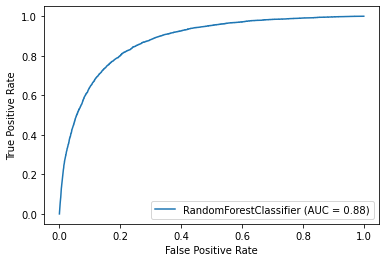

In [77]:
# Plotting ROC curve
plot_roc_curve(rf, X_train_reduced, y_train_balanced)
plt.show()

### Hyper parameter tuning for RandomForest

- We have done Hyper parameter tuning for Random Forest model
- As it will take too much time to fit and get best parameters we ran it once and **commented** the Cell

In [78]:
#rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [79]:
#params = {
#    'max_depth': [2,3,5,10,15,20,25,30],
#    'min_samples_leaf': [5,10,20,50,100,150,200,250,300],
#    'n_estimators': [10, 25, 50, 100, 150, 200, 250, 300]
#}

In [80]:
#scorer = metrics.make_scorer(metrics.roc_auc_score,
#                             greater_is_better=True,
#                             needs_proba=True,
#                             needs_threshold=False)

#grid_search = GridSearchCV(estimator=rf,
#                           param_grid=params,
#                           cv = 4,
#                           n_jobs=-1, verbose=1, scoring=scorer)

In [81]:
#%%time
#grid_search.fit(X_train_reduced, y_train_balanced)

In [82]:
#Using best paraneters obtained from GridSearchCV
rf = RandomForestClassifier(n_estimators=300, max_depth=30,min_samples_leaf=5,random_state=42, oob_score=True)

In [83]:
%%time
rf.fit(X_train_reduced, y_train_balanced)

Wall time: 1min 46s


RandomForestClassifier(max_depth=30, min_samples_leaf=5, n_estimators=300,
                       oob_score=True, random_state=42)

In [84]:
# Checking out of the bag score
rf.oob_score_

0.9400208170699974

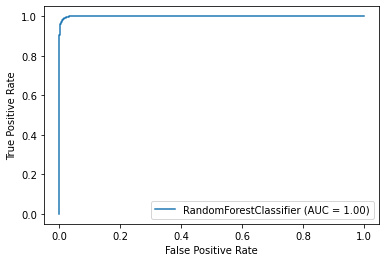

In [85]:
# plotting ROC curve
plot_roc_curve(rf, X_train_reduced, y_train_balanced)
plt.show()

In [86]:
print('AUC on test data by Random Forest =', metrics.roc_auc_score(y_true=y_test,
                                                             y_score=rf.predict_proba(X_test_reduced)[:, 1]))

AUC on test data by Random Forest = 0.8960449669846641


In [87]:
metrics.recall_score(y_true=y_test,y_pred=rf.predict(X_test_reduced))

0.644640234948605

In [88]:
metrics.precision_score(y_true=y_test,y_pred=rf.predict(X_test_reduced))

0.4184938036224976

- AUc score - 89.6
- Precision - 41.8
- Recall - 64.4
- Precision and Recall scores obtained from Random Forest model could be much more better than what we have obtained. So we try with other models as well to obtain bes scores.

### Using logistic regression 

In [89]:
# Logistic Regression initialisation
learner_pca = LogisticRegression()

In [90]:
# Fitting the model
model_pca = learner_pca.fit(X_train_reduced, y_train_balanced)

In [91]:
# Prediction on train
pred_probs_train = model_pca.predict_proba(X_train_reduced)

In [92]:
# Prediction on test
pred_probs_test = model_pca.predict_proba(X_test_reduced)

In [93]:
print('AUC on train data by Logisic regression=', metrics.roc_auc_score(y_true=y_train_balanced,
                                                             y_score=model_pca.predict_proba(X_train_reduced)[:, 1]))

AUC on train data by Logisic regression= 0.9092036299325686


In [94]:
print('AUC on test data by Logisic regression =', metrics.roc_auc_score(y_true=y_test,
                                                             y_score=model_pca.predict_proba(X_test_reduced)[:, 1]))

AUC on test data by Logisic regression = 0.8903096961386775


In [95]:
metrics.precision_score(y_true=y_test,y_pred=model_pca.predict(X_test_reduced))

0.26811937470393177

In [96]:
metrics.recall_score(y_true=y_test,y_pred=model_pca.predict(X_test_reduced))

0.8311306901615272

- AUc score - 89.03
- Precision - 26.8
- Recall - 83.1
- Precision and Recall scores obtained from Logistic Regression model are pretty good

- After Comparing all the models above (XG Boost, Random Forest and Logistic regression) we have got good results from logistic regression model.
- As we have mentioned that Recall vallue is more important in this Telecom Churn Business point of view, we have obtained a pretty good recall score
- We will be finalising our model as **Logistic regressione model with PCA**

### Model for Interpretation and to get important features

In [97]:
# run a random forest model on train data
max_features = int(round(np.sqrt(X_train_balanced.shape[1])))    # number of variables to consider to split each node
print(max_features)

rf_model = RandomForestClassifier(n_estimators=100, max_features=max_features, class_weight={0:0.1, 1: 0.9}, oob_score=True, random_state=4, verbose=1)

13


In [98]:
# fit model
rf_model.fit(X_train_balanced, y_train_balanced)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.2min finished


RandomForestClassifier(class_weight={0: 0.1, 1: 0.9}, max_features=13,
                       oob_score=True, random_state=4, verbose=1)

In [99]:
# OOB Score
rf_model.oob_score_

0.964168618266979

In [100]:
# predicting churn on test data
y_predicted = rf_model.predict(X_test_scaled)

# checking precision and recall
precision = metrics.precision_score(y_true=y_test, y_pred=y_predicted)
recall = metrics.recall_score(y_true=y_test, y_pred=y_predicted)
print("Precision: \t", round(precision, 2), "\n", "Recall: \t", round(recall, 2), sep='')

# checking area under ROC curve
y_pred_prob = rf_model.predict_proba(X_test_scaled)[:, 1]
print("ROC:    \t", round(metrics.roc_auc_score(y_test, y_pred_prob),2))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Precision: 	0.54
Recall: 	0.65
ROC:    	 0.91


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished


In [101]:
#All features
features = data_HVC.drop('churn', axis=1).columns

# taking feature_importances from above RF model
imp_val = rf_model.feature_importances_

# creating a dataframe with feature name and its corresponding importance
feat_imp = pd.DataFrame({'feature': features, 'importance_value': imp_val*100})
feat_imp = feat_imp[['feature', 'importance_value']]

# sorting the features based on their importance value
feat_imp = feat_imp.sort_values('importance_value', ascending=False).reset_index(drop=True)
print("Sum of importance=", feat_imp.importance_value.sum())
feat_imp

Sum of importance= 100.00000000000003


,feature,importance_value
0,total_ic_mou_8,4.068900
1,loc_ic_mou_8,3.998017
2,loc_ic_t2m_mou_8,2.851619
3,roam_ic_mou_8,2.417643
4,av_rech_amt_data_8,2.357647
5,roam_og_mou_8,2.354929
6,loc_og_mou_8,2.034402
7,total_roam_ic,2.005291
8,total_rech_amt_8,1.973608
9,loc_og_t2m_mou_8,1.957162


#### Extracting top 10 features

In [102]:
# extract top 'n' features
top_n = 15
top_features = feat_imp.feature[0:top_n].to_list()

In [103]:
top_features

['total_ic_mou_8',
 'loc_ic_mou_8',
 'loc_ic_t2m_mou_8',
 'roam_ic_mou_8',
 'av_rech_amt_data_8',
 'roam_og_mou_8',
 'loc_og_mou_8',
 'total_roam_ic',
 'total_rech_amt_8',
 'loc_og_t2m_mou_8',
 'total_roam_og',
 'total_rech_data_8',
 'arpu_8',
 'total_og_mou_8',
 'total_rech_data_val_8']

In [104]:
X_train = X_train_balanced[top_features]
X_test = X_test_scaled[top_features]

In [105]:
model = LogisticRegressionCV(penalty=('l2'), Cs=[0.1, 0.5, 1, 2, 3, 4, 5, 10], scoring = 'roc_auc')

In [106]:
model.fit(X_train, y_train_balanced)

LogisticRegressionCV(Cs=[0.1, 0.5, 1, 2, 3, 4, 5, 10], scoring='roc_auc')

In [107]:
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

In [108]:
#train recall score
print(metrics.recall_score(y_true=y_train_balanced, y_pred=y_pred_train))

0.8393963049700754


In [109]:
#train precison score
metrics.precision_score(y_true=y_train_balanced, y_pred=y_pred_train)

0.7841411833341436

In [110]:
#metrics for test data
print("AUC Score : ", metrics.roc_auc_score(y_true=y_test,y_score=model.predict_proba(X_test)[:, 1]))
print("Recall Score : ", metrics.recall_score(y_true=y_test, y_pred=y_pred_test))
print("Precision Score : ", metrics.precision_score(y_true=y_test, y_pred=y_pred_test))


AUC Score :  0.8709257289763169
Recall Score :  0.8179148311306902
Precision Score :  0.2196372239747634


In [111]:
model.intercept_

array([-1.7404519])

In [112]:
coefficients = model.coef_.reshape((top_n, 1))
coefficients

array([[-0.88011862],
       [-1.06818484],
       [-0.16436415],
       [-0.0753052 ],
       [-0.68352561],
       [ 0.0815785 ],
       [-0.35678891],
       [ 0.11255644],
       [-0.63801762],
       [-0.15280652],
       [ 0.1108996 ],
       [-1.17459354],
       [ 0.08850119],
       [-0.44569033],
       [ 0.65510982]])

In [113]:
#Creating intercept dataframe
intercept_df = pd.DataFrame(coefficients,index=top_features, columns=["coefficient"])

In [114]:
intercept_df.sort_values(by="coefficient", ascending=False)

,coefficient
total_rech_data_val_8,0.655110
total_roam_ic,0.112556
total_roam_og,0.110900
arpu_8,0.088501
roam_og_mou_8,0.081579
roam_ic_mou_8,-0.075305
loc_og_t2m_mou_8,-0.152807
loc_ic_t2m_mou_8,-0.164364
loc_og_mou_8,-0.356789
total_og_mou_8,-0.445690


### Business Recommendations

- As we see Roaming features have positive coefficients, it has positive effect on churning. So, it is recommended to provide good roaming packs/offers to attract the customers
- total_rech_data_val_8 is derived feature which indicates amount of recharge done for data. So, this has a positive impact on churning. SO, it is advised to provide good data recharge packages.